# Chapter 5: Probability Distributions
Probability takes on a value from 0 to 1, with a probability  𝑃(𝑋)=0
  for an event meaning that the stated condition - e.g., a standard 6 sided die will yield a 7 when rolled - would never occur in an infinite number of flips. A probability of 0.5 means that in a sufficiently large number of trials, approximately half of the trials would result in the stated condition. A probability of 1 means all trials would result in the stated condition so that the number of successes in a trial would be equal to the number of attempts.

Probability Distributions display all of the possible values that a random variable  𝑋
  could take on on the x-axis, and the corresponding probability of that value on the y-axis. Hence, the area under the probability distribution will always be equal to one.

The random variable  𝑋¯
 , which represents the the mean of a sample drawn from a larger population, defines a sampling distribution, which gives all values possible for  𝑋¯
 ,  𝑋𝑖¯
 , and the probability of that value occuring.  𝑋¯
  can take on values falling on its sampling distribution, which describe the likelihood of getting a given mean for a given sample size. This sampling distribution takes on a standard deviation of  𝑆(√𝑛)
 , otherwise known as the standard error.
Distributions can be described by:

Their mean,  𝜇
 (or  𝑋¯
  for sampling distributions), which is the average value of the dataset.
Their standard deviation,  𝜎
 , which determines how flat the curve is, and how densely the data clusters around the mean(SE for sampling distributions).
Skewness,  𝑆𝐾𝑃
 , which refers to a distortion or asymmetry of a distribution.
Kurtosis,  𝑘
 , which describes how much of the distribution lays in its tails.

### Types of Probability Distributions
#### Normal Distributions
Normal Distribution, also known as Gaussian distribution, is ubiquitous in Data Science and often used when modeling economic phenomena. You will encounter it in predictive models you create. It is one of the assumptions of many statistical techniques.

A normal distribution has a bell-shaped density curve described by its mean $\mu$ and standard deviation $\sigma$. The density curve is symmetrical(skewness of 0), centered about its mean, with its spread determined by its standard deviation. Data near the mean - e.g., $\sigma < 1$ - are more frequent in occurrence than data far from the mean - e.g., $\sigma > 2$. 


A random variable $X$ which follows a normal distribution with mean $\mu$ and standard deviation $\sigma$ and has this density function: 
<h3 align="center">
    <font size="4">
        $ X = \frac{1}{\sigma\sqrt{2\pi}}e^{-\frac{1}{2}(\frac{x-\mu}{\sigma})^2} $
    </font>
    </h3> 
    
If one knew the mean and standard deviation of a particular distribution, it would be possible to estimate the probability of drawing a value from a particular range - e.g., $a \leq X \leq b$ - by taking the definite integral of this function: 
<h3 align="center">
    <font size="4">
        $\int_{a}^{b}\frac{1}{\sigma\sqrt{2\pi}}e^{-\frac{1}{2}(\frac{x-\mu}{\sigma})^2}dx$.
    </font>
</h3>

#### Standard Normal Distribution

The standardized normal distribution is the most important member of the family of normal probability distributions—the one with $\mu = 0$  and $\sigma = 1$. The normal random variable distributed according to the standard normal distribution is called the standard normal variable and is denoted by $Z$. It represents the number of standard deviations a given point X lies from the mean of the standard normal distribution.  It is expressed as
<h3 align="center">
    <font size="4">
        $ Z =  \frac{X-\mu}{\sigma}$
    </h3> 

A key feature of all normal distributions is that, using the equation above, they can be transformed to be analyzed using the standard normal distribution.
    
_If you divide any normal distribution by its standard deviation(normalizing the SD to be 1), that normal distribution becomes the standard normal distribution._

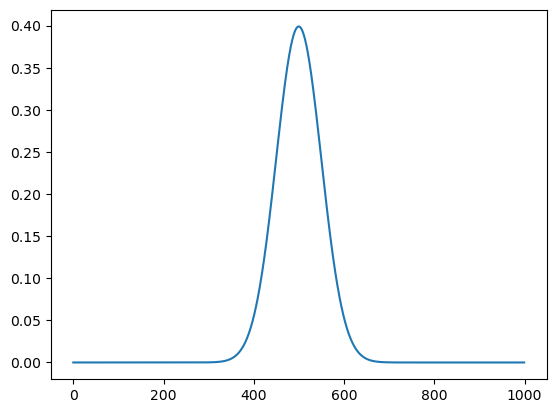

In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
from stats import *

# takes a list of x values in a given range with some number of finite divisons, will create a y value that correlates with
# each x value that was passed
def normal_dist(mean , sd, x = np.linspace(-10, 10, 1000) ):
    prob_density = 1 / (sd * (2 * np.pi) ** .5) * np.exp(-0.5*((x-mean)/sd)**2)
    return prob_density

normal_dist_list = normal_dist(mean=0,sd=1)
plt.plot(normal_dist_list)

Text(0.5, 1.0, '$\\mu$ = 0\t$\\sigma_0$ = 1\t$\\sigma_1$ = 2\t$\\sigma_2$ = 3\t')

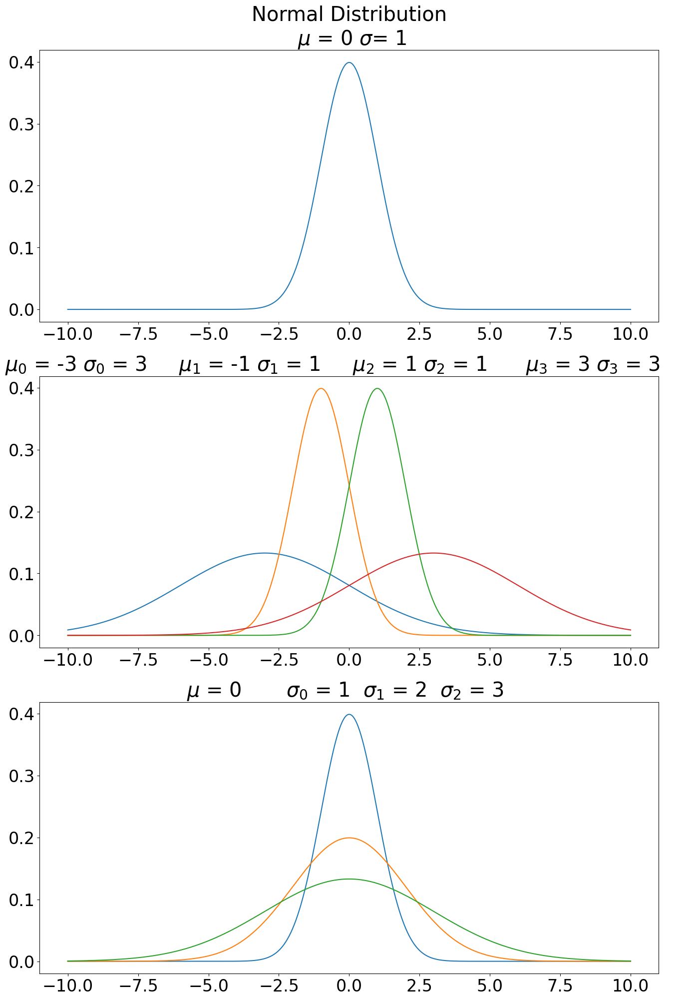

In [2]:
plt.rcParams.update({"font.size":24})
fig, axs = plt.subplots(3, 1, figsize=(16, 24))
x = np.linspace(-10, 10, 1000)

# perform transformation
mean_, sd = 0,1
normal_dist_list = normal_dist(mean=mean_, sd=sd, x=x)
axs[0].plot(x, normal_dist_list)
axs[0].set_title("Normal Distribution\n $\mu$ = "+   
                  str(mean_)+ " $\sigma$= " + str(sd))
ax1_title=""
ax1_sub=0
for mean_ in range(-3,4, 2):
    sd = abs(mean_) 
    normal_dist_list = normal_dist(mean=mean_, sd=sd)
    axs[1].plot(x, normal_dist_list, label= "Normal Distribution")
    ax1_title= ax1_title + "$\mu_"+ str(ax1_sub)+"$ = "+str(mean_)+" "
    ax1_title= ax1_title + "$\sigma_"+str(ax1_sub)+"$ = "+str(sd)+ "\t"
    ax1_sub +=1
axs[1].set_title(ax1_title)

ax2_title ="$\mu$ = 0\t"
ax2_sub =0
for sd in range(1,4):
    mean_ =0
    normal_dist_list= normal_dist(mean=mean_, sd=sd)
    axs[2].plot(x, normal_dist_list)
    ax2_title= ax2_title + "$\sigma_"+str(ax2_sub)+"$ = "+str(sd)+ "\t"
    ax2_sub +=1
axs[2].set_title(ax2_title)

## Lognormal Distribution

A random variable $X$ is said to have a lognormal distribution if $Y = ln(X)$ is normally distributed, where $ln$ denotes the natural logarithm.

In other words, $X$ is log-normally distributed if the natural logarithm of $X$ is normally distributed with mean $\mu$  and variance $\sigma ^2$:

$ln(X) = N(\mu, \sigma^2)$

The lognormal distribution is positively skewed with many small values and just a few large values. Consequently, the mean is greater than the mode in most cases.
Since the lognormal distribution is bound by zero on the lower side, it is perfect for modeling asset prices that cannot take negative values. On the other hand, the normal distribution cannot be used for the same purpose because it has a negative side.

When the returns on a stock (continuously compounded) follow a normal distribution(as shown above), the stock prices follow a lognormal distribution. Note that even if returns do not follow a normal distribution, the lognormal distribution is still the most appropriate model for stock prices.

The probability density function of the distribution is:
<h3 align="center">
    <font size="4">
        $f(x) = \frac{1}{x\sigma\sqrt{2\pi}}e^{\frac{- (lnx-\mu)^2}{2\sigma^2}}$
    </font>
    </h3> 


In [3]:
import warnings
warnings.filterwarnings("ignore")

def create_lognormal(mean, sd, x = np.linspace(0, 10, 1000)):
    density_points = (1 / x*sd*np.sqrt(2*np.pi))*np.e**(
        -(np.log(x)-mean)**2 / (2*sd**2))
    return density_points

x=np.linspace(0,10,10000)
mean, sd =1,1
log_norm=create_lognormal(mean=mean,sd=sd,x=x)

Text(0.5, 1.0, 'Lognormal Distribution with μ = 1 and σ =  1')

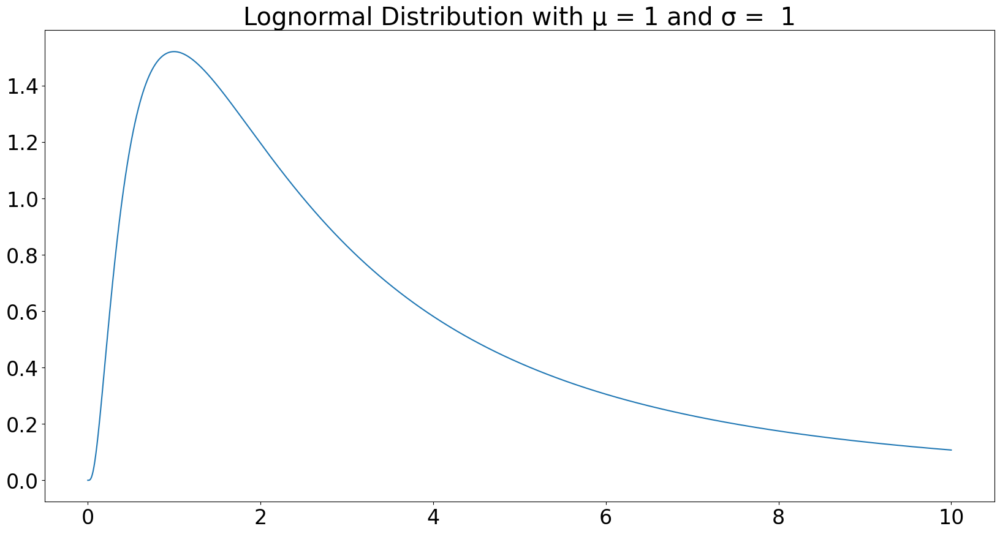

In [4]:
fig,ax=plt.subplots(figsize = (20,10))
ax.plot(x, log_norm)
ax.set_title("Lognormal Distribution with μ = "+str(mean)+" and σ =  "+str(sd))

Text(0.5, 1.0, 'Lognormal Distribution with μ = 1 and σ =  1')

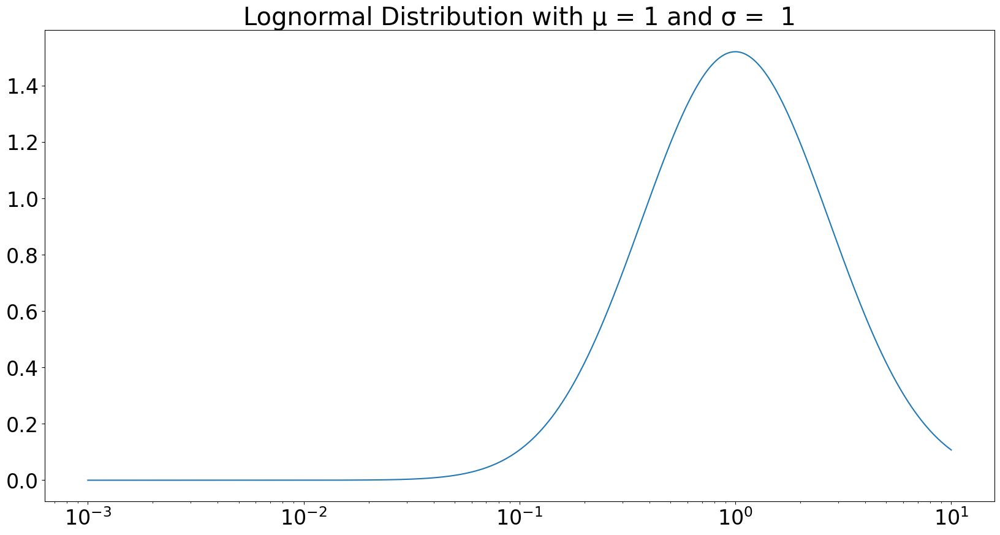

In [5]:
fig,ax=plt.subplots(figsize = (20,10))
ax.plot(x, log_norm)
plt.xscale("log")
ax.set_title("Lognormal Distribution with μ = "+str(mean)+" and σ =  "+str(sd))

### Binomial Distribution
If $X$ is a random variable that yields the number of successess seen in the trials of a binomial(yes or no) experiment, then we say that $X$ follows a binomial distribution.

We are interested in finding the probability that some particular number of successes is seen in the course of that binomial experiment.

- $n$ = the number of trials
- $x$ = some number of successes, with $0≤x≤n$
- $p$ = the probability of success on any one trial
- $q$ = $1−p$ = the probability of failure on any one trial

A binomial trial can result in a success with probability $p$ and a failure with probability $q = 1−p$. Then the probability distribution of the binomial random variable $X$, the number of successes in $n$ independent trials, is
<h3 align="center">
    <font size="4">
        $b(x; n, p) = {n \choose x}p^xq^{n-x}$
    </font>
    </h3> 

Where  $x = 0, 1, 2,..., n$ and ${n \choose x}=\frac{n!}{x!(n-x)!}$

The most common example is flipping a coin, which can be modeled as $x=$ the number of "heads" or "tails" in $n$ trials. The probability of success and failure is 0.5. 

The mean $\mu$ and standard deviation $\sigma$ for a binomial distribution $b(x; n, p)$ are
- $\mu = np$
- $\sigma = \sqrt{np(1-p)}$

We define and graph the binomial distribution for various x, p, and n values. 

As an example of the binomial distribution, we can think of the top hedge funds in the stock market. If we assume that the markets are efficient and any given mutual fund only has a 50% probability of beating the market in every year, if there is a large $n$, or a large number of firms, many of them will survive for many years, just by chance. This example is demonstrated wonderfully in Burton Malkiel's *A Random Walk Down Wallstreet* in which he describes a coin flipping contest of 1000 people, which guarantees that multiple people will win more than 10 rounds simply by chance, and then become world-renouned as amazing coin-flippers. 

- How many funds will 'beat' an efficient market for more than 10 years if there are 1000 funds to start? We will find the probability of a single fund beating the market for that long and then multiply that by 1000 funds. 

- $ = P(1) = {10 \choose 1}0.5^{1}0.5^{10-1} = 0.0097$, so there is a 0.97% chance of a single fund beating an efficient market for 10 years, and we can reasonably expect that 97 funds will beat the market for 10 years if 100 start, just by chance.

In [6]:
def binomial(x, n, p):
    q= 1-p
    return float(math.factorial(n)) / (
        math.factorial(x) * math.factorial(n - x)) * p**x * q**(n - x)
binomial(x=50,n=100,p=.5)

0.07958923738717875

In [7]:
#probability of generating a total between X0 and X1 for a given p,n
def probablity_of_outcome(X0,X1,p,n):
    P=0
    for x in range(X0,X1+1):
        P += binomial(x=x,n=100,p=.5)
    return P
p, n= .5,100
X0=40
X1=60
P

NameError: name 'P' is not defined

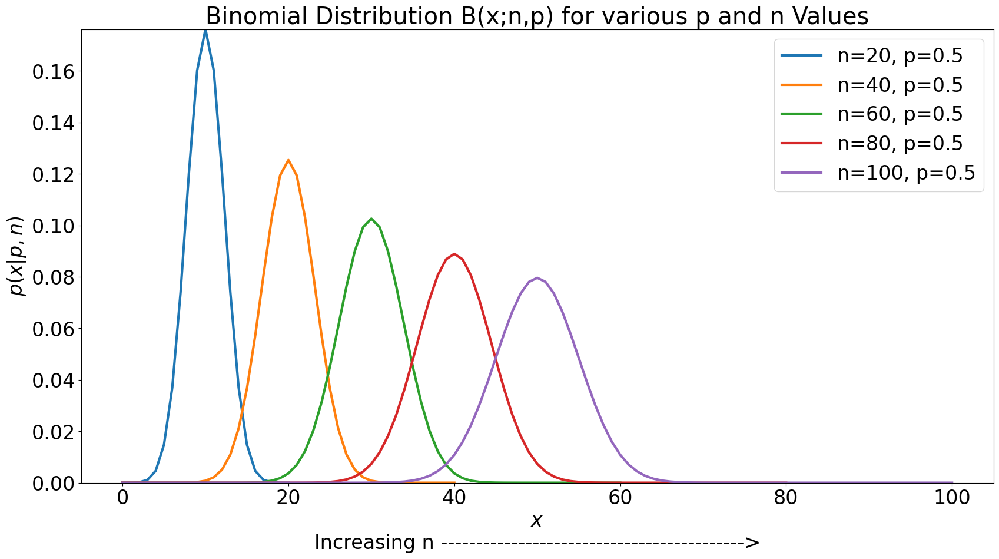

In [8]:
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import Normalize

fig, ax = plt.subplots(figsize=(20, 10))
cmap = cm.get_cmap('Blues')
ymax =binomial(20*p,20,p)
for n in range(20,101,20):
#    x=int(n*p)
#make a list of probabilityu of every possible outcome
# from 0 to n
    binom_vars=[binomial(x,n,p) for x in range(n+1)]
    plt.plot(binom_vars, linewidth =3, label=f"n={n}, p={p}")
ax.set_ylim(ymin=0,ymax=ymax)

plt.xlabel("$x$\nIncreasing n ------------------------------------------->",
           fontsize=24)
plt.ylabel("$p(x | p, n)$", fontsize=24)
plt.title("Binomial Distribution B(x;n,p) for various p and n Values")
plt.legend()

In [9]:
#!pip install yfinance
import pandas as pd
import pandas_datareader.data as web
import datetime
import yfinance as yf


In [10]:
yf.pdr_override()
start = datetime.datetime(2012, 1 , 1)
end = datetime.datetime.today()

data_dict = {}
stocks = ["MSFT", "AAPL", "PG", "TSLA"]
for stock in stocks:
    data_dict[stock] = web.get_data_yahoo(stock, start, end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [11]:
data_dict["MSFT"]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-01-03,26.549999,26.959999,26.389999,26.770000,21.413065,64731500
2012-01-04,26.820000,27.469999,26.780001,27.400000,21.916996,80516100
2012-01-05,27.379999,27.730000,27.290001,27.680000,22.140963,56081400
2012-01-06,27.530001,28.190001,27.530001,28.110001,22.484915,99455500
2012-01-09,28.049999,28.100000,27.719999,27.740000,22.188959,59706800
...,...,...,...,...,...,...
2023-04-11,285.750000,285.980011,281.640015,282.829987,282.829987,27276600
2023-04-12,284.790009,287.010010,281.959991,283.489990,283.489990,27403400
2023-04-13,283.589996,289.899994,283.170013,289.839996,289.839996,24222700


## create data frame for the close data of all four stocks

In [12]:
[df["Close"] for df in data_dict.values()]

[Date
 2012-01-03     26.770000
 2012-01-04     27.400000
 2012-01-05     27.680000
 2012-01-06     28.110001
 2012-01-09     27.740000
                  ...    
 2023-04-11    282.829987
 2023-04-12    283.489990
 2023-04-13    289.839996
 2023-04-14    286.140015
 2023-04-17    288.799988
 Name: Close, Length: 2840, dtype: float64,
 Date
 2012-01-03     14.686786
 2012-01-04     14.765714
 2012-01-05     14.929643
 2012-01-06     15.085714
 2012-01-09     15.061786
                  ...    
 2023-04-11    160.800003
 2023-04-12    160.100006
 2023-04-13    165.559998
 2023-04-14    165.210007
 2023-04-17    165.229996
 Name: Close, Length: 2840, dtype: float64,
 Date
 2012-01-03     66.830002
 2012-01-04     66.800003
 2012-01-05     66.519997
 2012-01-06     66.360001
 2012-01-09     66.639999
                  ...    
 2023-04-11    150.660004
 2023-04-12    151.070007
 2023-04-13    151.770004
 2023-04-14    151.000000
 2023-04-17    151.050003
 Name: Close, Length: 2840, dtype: f

In [13]:
close_data = pd.concat([df["Close"] for df in data_dict.values()],
                      keys = data_dict.keys(),
                      axis=1)
close_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,26.770000,14.686786,66.830002,1.872000
2012-01-04,27.400000,14.765714,66.800003,1.847333
2012-01-05,27.680000,14.929643,66.519997,1.808000
2012-01-06,28.110001,15.085714,66.360001,1.794000
2012-01-09,27.740000,15.061786,66.639999,1.816667
...,...,...,...,...
2023-04-11,282.829987,160.800003,150.660004,186.789993
2023-04-12,283.489990,160.100006,151.070007,180.539993
2023-04-13,289.839996,165.559998,151.770004,185.899994


Text(0.5, 1.0, 'Daily Stock Prices')

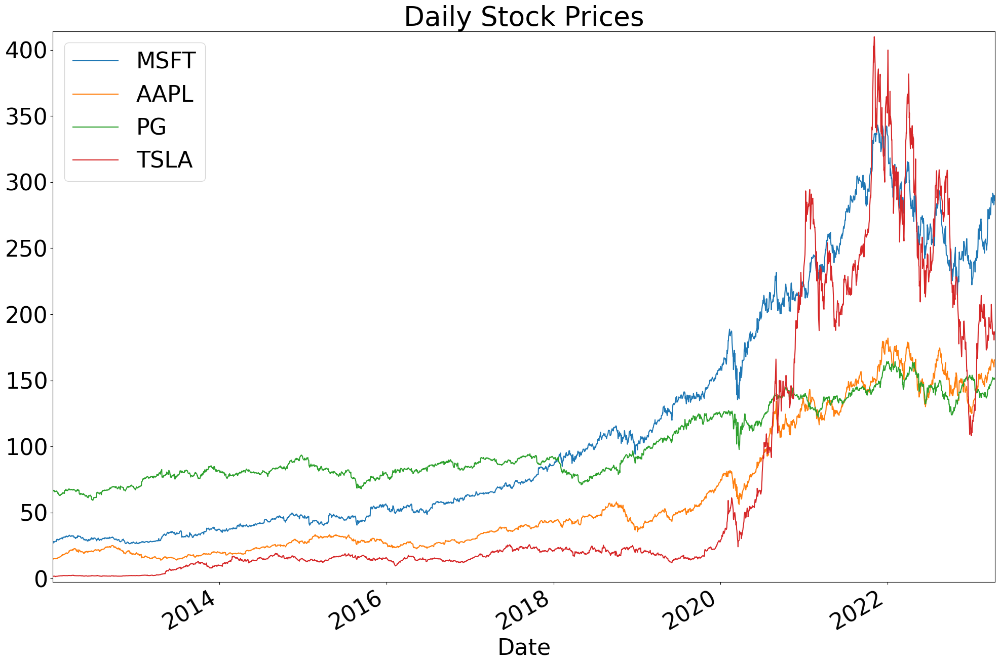

In [14]:
import matplotlib.pyplot as plt
plt.rcParams['axes.xmargin']=0
plt.rcParams['axes.ymargin']=.01
plt.rcParams.update({'font.size':'32'})
fig, ax = plt.subplots(figsize = (24,16))
close_data.plot.line(ax = ax, legend = True)
ax.set_title("Daily Stock Prices")

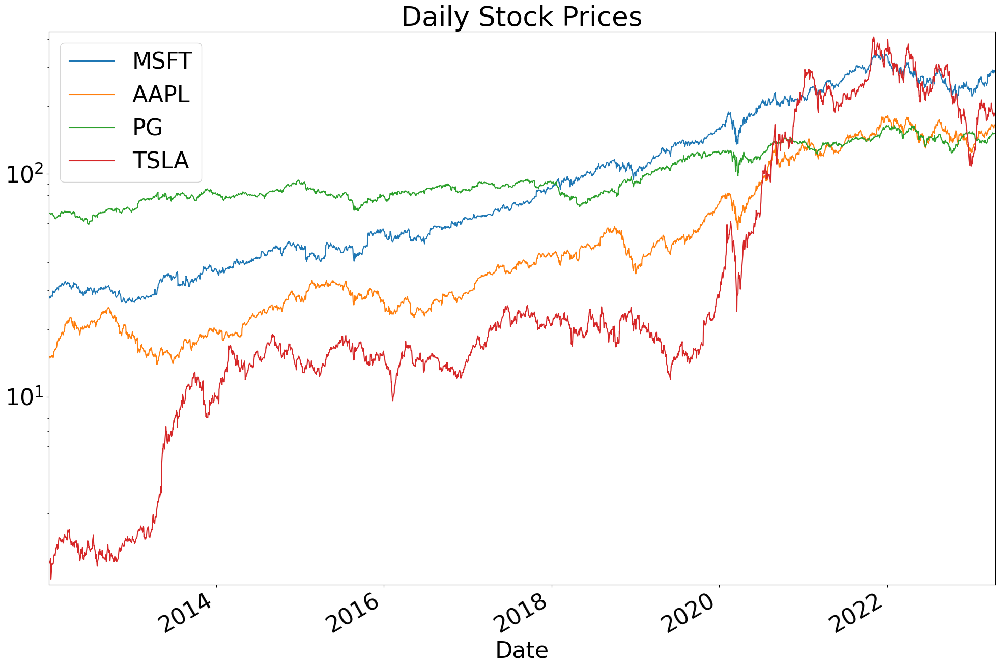

In [15]:
fig, ax = plt.subplots(figsize = (24,16))
close_data.plot.line(ax = ax, legend = True)
ax.set_title("Daily Stock Prices")
ax.set_yscale("log")

Text(0.5, 1.0, 'AAPL')

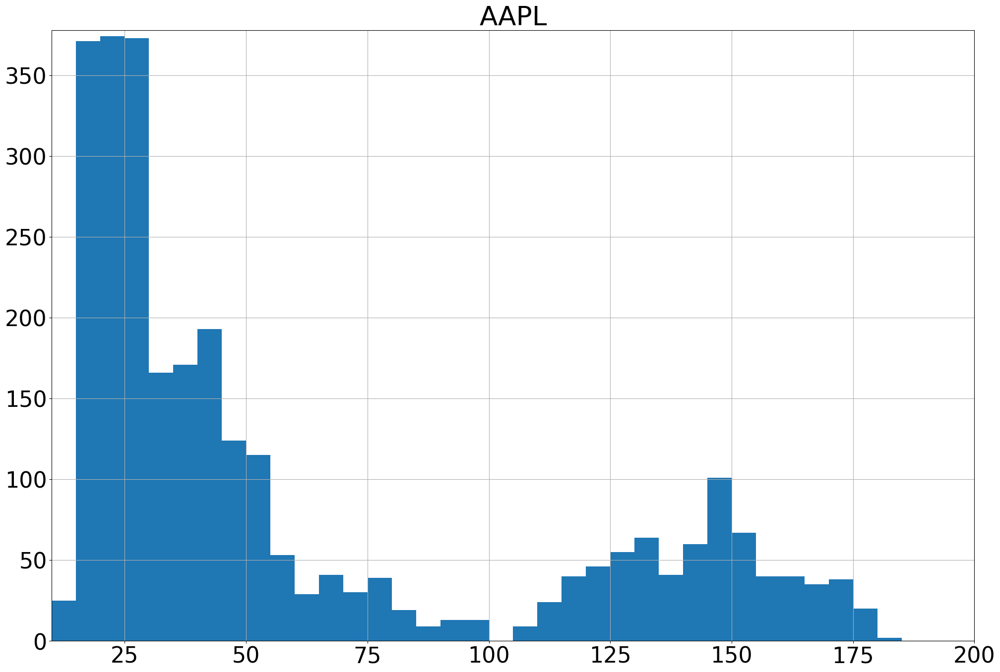

In [16]:
fig, ax = plt.subplots(figsize = (24, 16))
stock="AAPL"
#close_data["AAPL"].hist(bins = 50)
close_data[stock].hist(bins = [i for i in range(10,201,5)])
ax.set_title(stock)

In [17]:
log_data=np.log(close_data)
log_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,3.287282,2.686948,4.202152,0.627007
2012-01-04,3.310543,2.692308,4.201703,0.613743
2012-01-05,3.320710,2.703349,4.197503,0.592221
2012-01-06,3.336125,2.713748,4.195094,0.584448
2012-01-09,3.322875,2.712161,4.199305,0.597003
...,...,...,...,...
2023-04-11,5.644846,5.080161,5.015026,5.229985
2023-04-12,5.647177,5.075799,5.017743,5.195952
2023-04-13,5.669329,5.109334,5.022366,5.225209


Text(0.5, 1.0, 'AAPL')

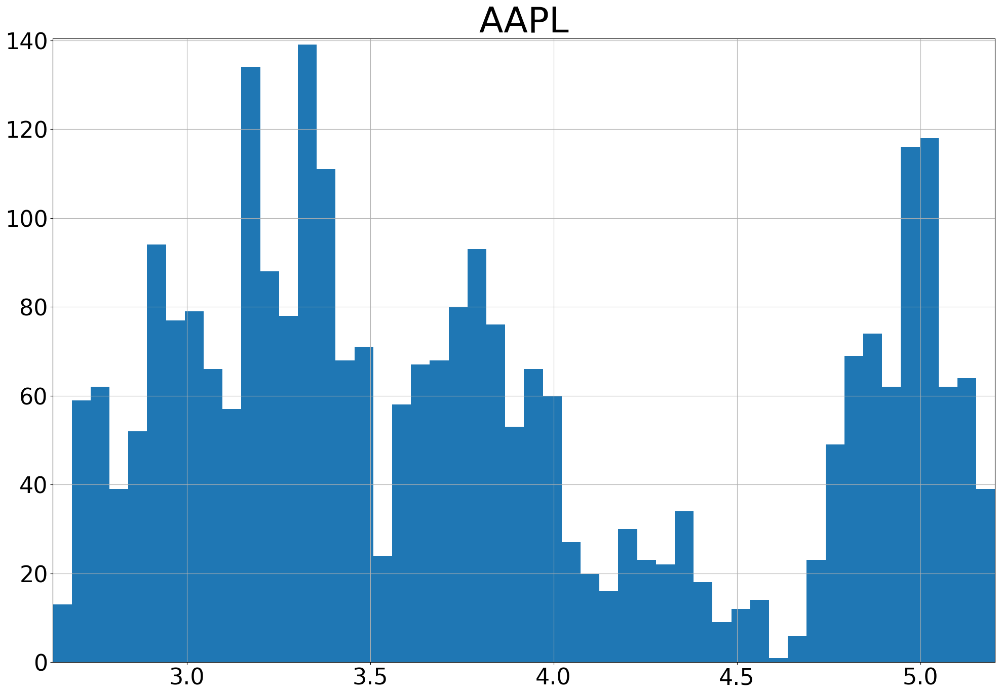

In [18]:
fig, ax = plt.subplots(figsize = (24, 16))
stock="AAPL"
log_data[stock].hist(bins = 50)
ax.set_title(stock, fontsize=50)

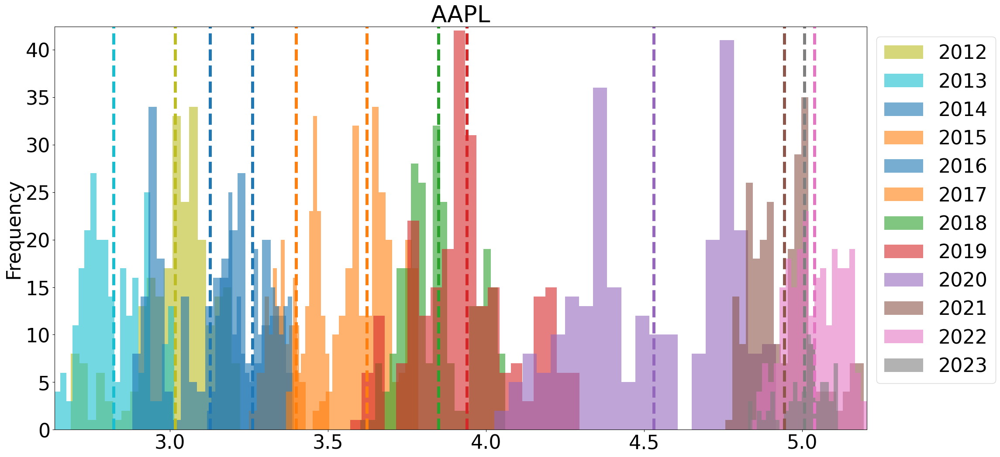

In [19]:
def graph_yearly_distributions(data, stock, figsize = (24,12), density =False):
    years = sorted(list(set(data.index.year)))
    fig, ax= plt.subplots(figsize=figsize)
    for year in years:
        color = "C"+str(year%12)
        year=str(year)
        plot_data=data[stock].loc[year]
        plot_data.plot.hist(color=color, 
                            alpha =.6,
                            label=year,
                            bins=20,
                            density =density,
                            ax=ax)
        ax.axvline(plot_data.mean(),
                  color=color,
                  linewidth=5,
                  ls="--")
        ax.set_title(stock)
        ax.legend(bbox_to_anchor = (1,1))
        
        
graph_yearly_distributions(log_data,stock,density=False)

In [20]:
price_change_data=log_data.diff()
price_change_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,NaN,NaN,NaN,NaN
2012-01-04,0.023261,0.005360,-0.000449,-0.013264
2012-01-05,0.010167,0.011041,-0.004201,-0.021522
2012-01-06,0.015415,0.010400,-0.002408,-0.007773
2012-01-09,-0.013250,-0.001587,0.004211,0.012556
...,...,...,...,...
2023-04-11,-0.022929,-0.007620,-0.001989,0.012281
2023-04-12,0.002331,-0.004363,0.002718,-0.034033
2023-04-13,0.022152,0.033535,0.004623,0.029257


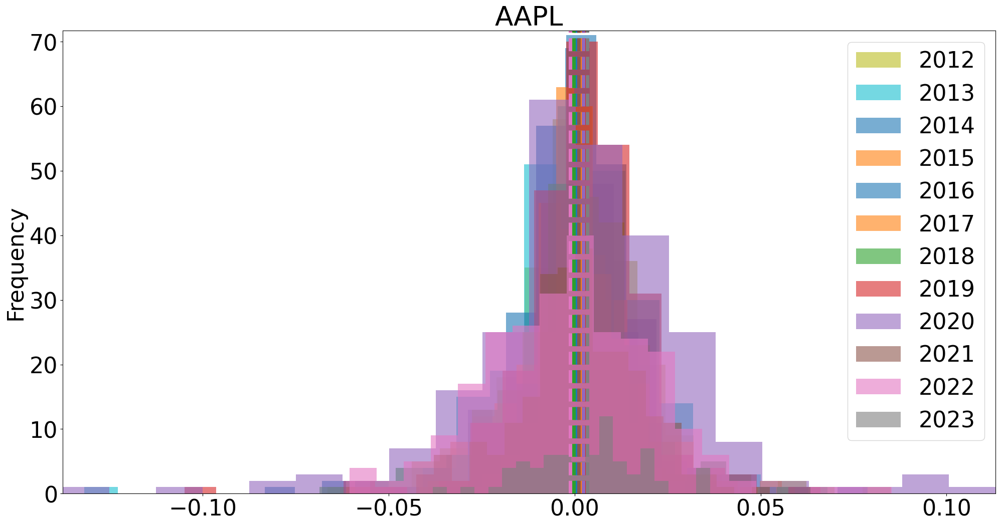

In [21]:
graph_yearly_distributions(price_change_data,stock,density=False)

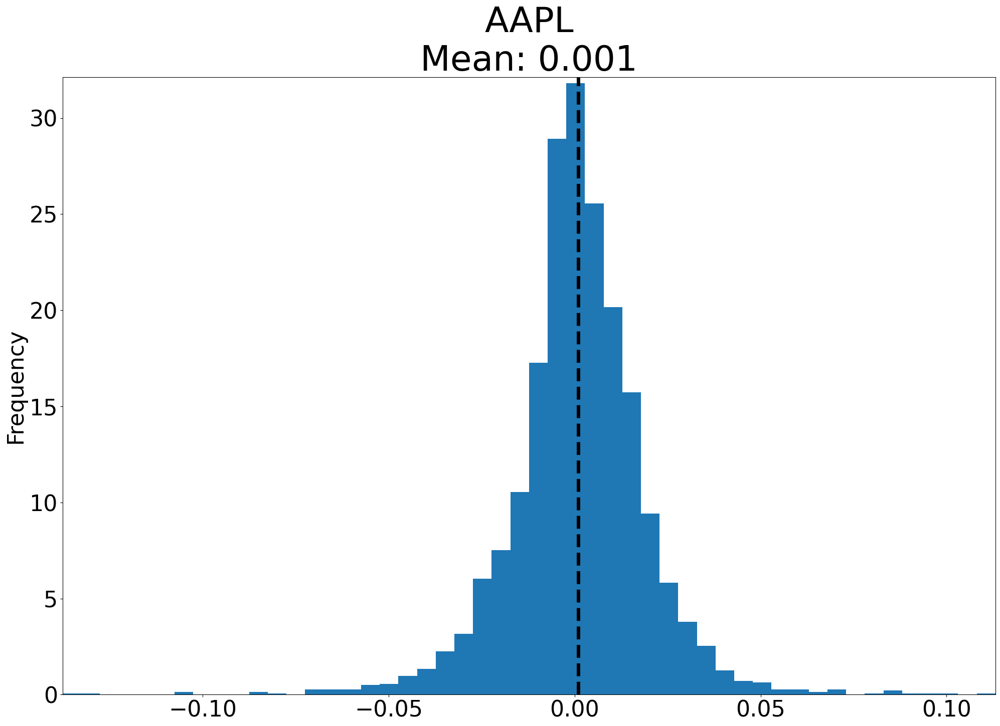

In [22]:
fig, ax = plt.subplots(figsize = (24, 16))
stock="AAPL"
price_change_mean=round(price_change_data[stock].mean(),3)
price_change_data[stock].dropna().plot.hist(bins = 50,density =True)
ax.set_title(stock+"\nMean: "+str(price_change_mean), fontsize=50)
ax.axvline(price_change_mean,color="k",linewidth=5,
          ls="--")

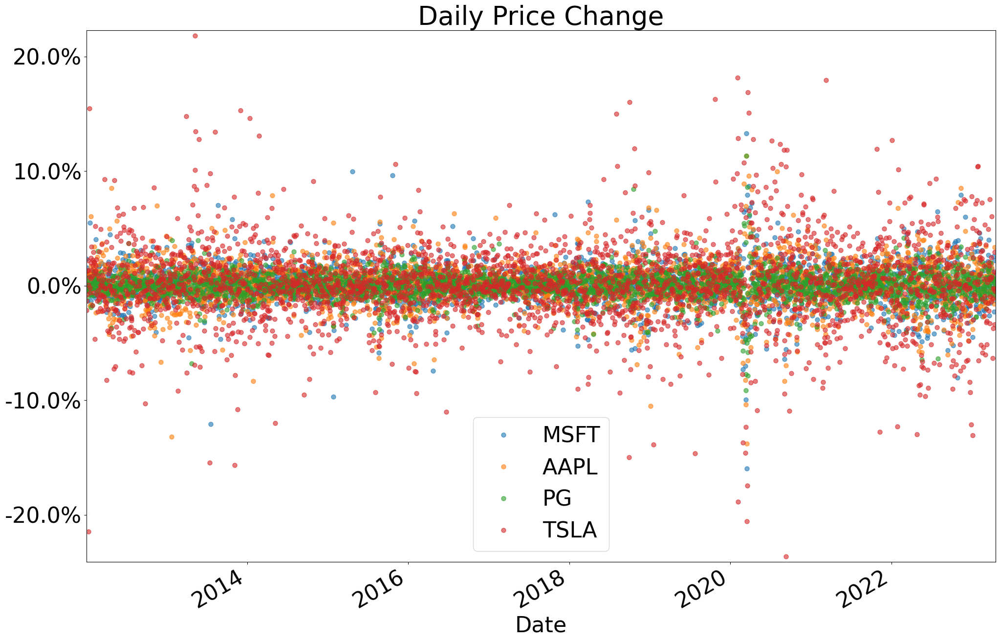

In [23]:
fig, ax = plt.subplots(figsize = (24,16))
for key in price_change_data.keys():
    price_change_data[key].plot.line(marker=".",
                                     markersize=13,
                                     alpha=.6,
                                     ls="",
                                     ax=ax)
ax.set_title("Daily Price Change")
y_vals = ax.get_yticks()
ax.set_yticklabels([str(round(y*100,1))+"%" for y in y_vals])
plt.legend()

In [24]:
from stats import *
stats_df=gather_statistics(price_change_data.mul(100),
                          sample=True).round(2)
stats_df

,MSFT,AAPL,PG,TSLA
mean,0.08,0.08,0.03,0.16
median,0.06,0.08,0.04,0.13
variance,2.82,3.34,1.28,12.85
S.D.,1.68,1.83,1.13,3.58
skewness,0.00,-0.00,-0.00,0.00
kurtosis,33225.15,24758.37,42726.71,22842.61


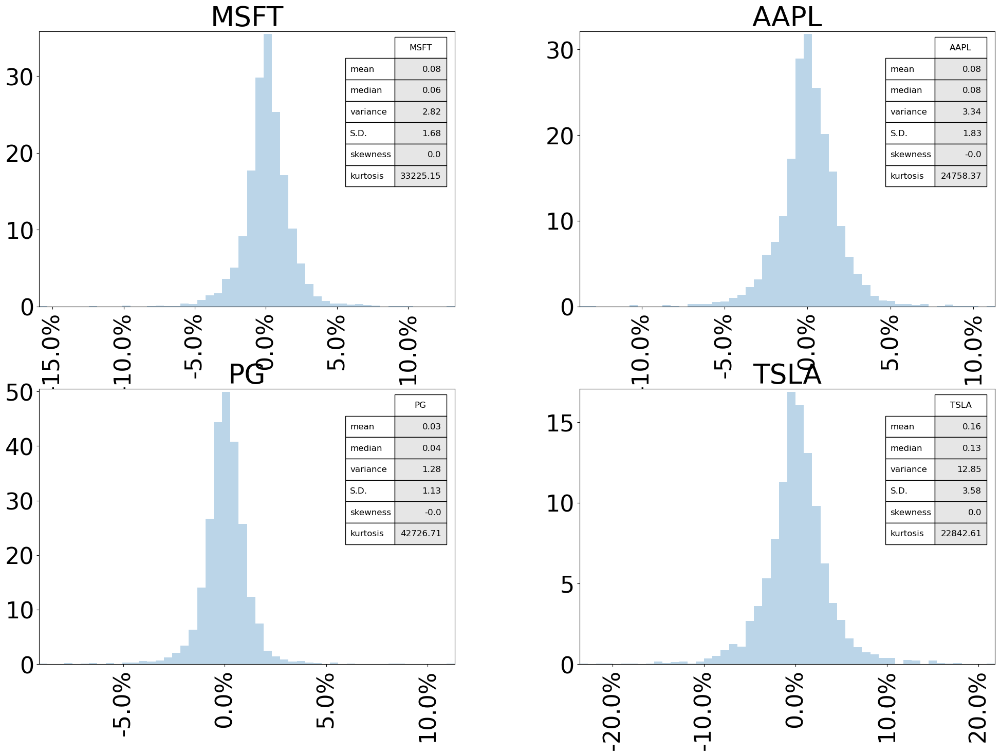

In [25]:
from pandas.plotting import table
fig, axs = plt.subplots(2,2, figsize = (24,16))
price_change_data.hist(bins = 50, 
                       alpha = .3, 
                       label = price_change_data.keys(), 
                       ax = axs, 
                       density = True)
for sublist in axs:
    for ax in sublist:
        x_vals=ax.get_xticks()
        ax.set_xticklabels([str(round(x*100,1))+"%" for x in x_vals],
                         rotation=90)
    
        stock=ax.get_title()
        hist_data=stats_df[stock]
        
        stats=table(ax, hist_data,
                   colWidths=[.1],
                   cellColours=[[(.9,.9,.9)]]*6,
                   loc="upper right")
        stats.scale(1.25,2.5)
        stats.set_fontsize(20)
        ax.grid(False)

In [26]:
price_change_data.div(price_change_data.std())

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,NaN,NaN,NaN,NaN
2012-01-04,1.385817,0.293051,-0.039664,-0.370088
2012-01-05,0.605723,0.603678,-0.371086,-0.600473
2012-01-06,0.918388,0.568615,-0.212741,-0.216886
2012-01-09,-0.789389,-0.086796,0.371969,0.350314
...,...,...,...,...
2023-04-11,-1.366051,-0.416645,-0.175739,0.342659
2023-04-12,0.138864,-0.238540,0.240088,-0.949537
2023-04-13,1.319752,1.833590,0.408399,0.816280


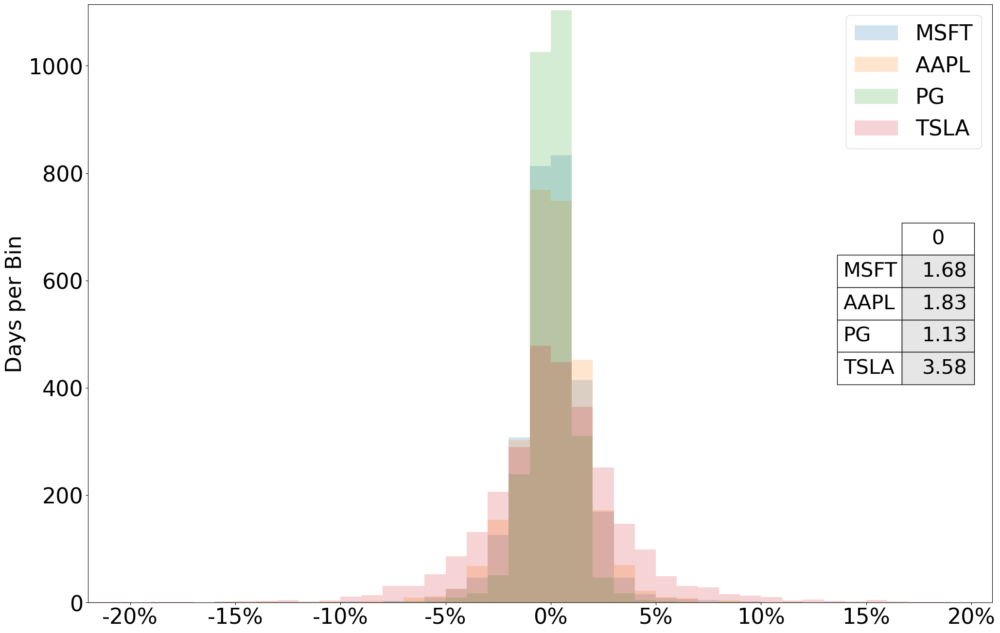

In [27]:
plot_data=price_change_data.mul(100)
fig, ax = plt.subplots(figsize = (24,16))
for key in price_change_data:
    plot_data[key].hist(bins = [x for x in range(-22,22,1)], 
                                alpha = .2, 
                                label = key, 
                                linewidth = 10, 
                                density = False,
                               ax=ax)
ax.set_ylabel("Days per Bin")
x_vals = ax.get_xticks()
ax.set_xticklabels([str(int(x))+ "%" for x in x_vals])
stats=table(ax, 
            round(plot_data.std(),2),
            colWidths=[.1],
            cellColours=[[(.9,.9,.9)]]*4,
            loc="center right")
stats.scale(.8,4)
stats.auto_set_font_size(False)
stats.set_fontsize(30)
ax.grid(False)
plt.legend()

In [28]:
plot_data.std()

MSFT    1.678514
AAPL    1.828926
PG      1.131954
TSLA    3.584129
dtype: float64

In [29]:
norm_plot_data = price_change_data.div(price_change_data.std())
norm_plot_data

,MSFT,AAPL,PG,TSLA
Date,,,,
2012-01-03,NaN,NaN,NaN,NaN
2012-01-04,1.385817,0.293051,-0.039664,-0.370088
2012-01-05,0.605723,0.603678,-0.371086,-0.600473
2012-01-06,0.918388,0.568615,-0.212741,-0.216886
2012-01-09,-0.789389,-0.086796,0.371969,0.350314
...,...,...,...,...
2023-04-11,-1.366051,-0.416645,-0.175739,0.342659
2023-04-12,0.138864,-0.238540,0.240088,-0.949537
2023-04-13,1.319752,1.833590,0.408399,0.816280


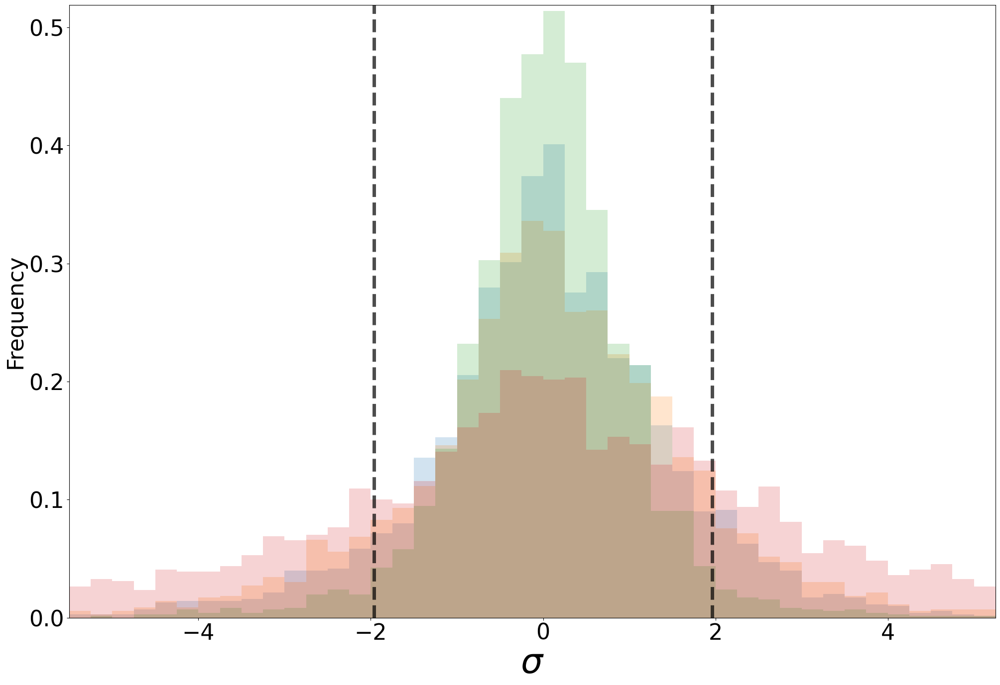

In [30]:
fig, ax = plt.subplots(figsize = (24,16))
for key in norm_plot_data:
    plot_data[key].hist(bins = [x/4 for x in range(-22,22,1)], 
                                alpha = .2, 
                                label = key, 
                                linewidth = 10, 
                                density = True,
                               ax=ax)
ax.set_ylabel("Frequency")
ax.set_xlabel("$\sigma$", fontsize = 50)
ax.axvline(-1.96, linewidth=5,ls="--", color="k",alpha=.7)
ax.axvline(1.96, linewidth=5,ls="--", color="k",alpha=.7)
ax.grid(False)

### $\beta$ and Volatility

By plotting distributions of specific stocks, we have casually shown that TSLA is relatively volatile compared to PG, MSFT, and AAPL. Yet, how would we compare this volatility to the *average* volatility in the market? In finance, the relative volatility of a stock is referred to as it's $\beta$ (_beta_). $\beta$ is unique for each security in a portfolio. It is a weight that describes the sensitivity of that security to market changes. $\beta$ is generally found using past market data, where average market performance is indicated by the S&P500.A $\beta$ for a given security, $i$, can be found by taking the ratio of the covariance between the returns from that security and the market returns, and the variance of the market returns. This will quantify relative volatility of a security: 
<h3 align="center">
    <font size="5">
        $ \beta_i = \frac{Cov(r_i,r_m)}{Var(r_m)}$
    </font>
</h3>

Let's add the S&P500 to our list of stocks and compare the distribution of changes in each stock to the S&P500. We will save the list of stocks before adding the S&P500 to aid the next part of this exercise.

In [31]:
price_change_data["S&P500"] = web.get_data_yahoo('^GSPC',  
                       start,
                       end)["Close"]

[*********************100%***********************]  1 of 1 completed


In [32]:
price_change_data["S&P500"] = np.log(price_change_data["S&P500"]).diff()
price_change_data

,MSFT,AAPL,PG,TSLA,S&P500
Date,,,,,
2012-01-03,NaN,NaN,NaN,NaN,NaN
2012-01-04,0.023261,0.005360,-0.000449,-0.013264,0.000188
2012-01-05,0.010167,0.011041,-0.004201,-0.021522,0.002939
2012-01-06,0.015415,0.010400,-0.002408,-0.007773,-0.002540
2012-01-09,-0.013250,-0.001587,0.004211,0.012556,0.002259
...,...,...,...,...,...
2023-04-11,-0.022929,-0.007620,-0.001989,0.012281,-0.000041
2023-04-12,0.002331,-0.004363,0.002718,-0.034033,-0.004143
2023-04-13,0.022152,0.033535,0.004623,0.029257,0.013176


In [33]:
def calculate_beta(data, stock_key, market_key):
    df = data[[stock_key, market_key]].dropna()
    stock_cov = covariance(df[stock_key], df[market_key], sample = True) 
    market_var = variance(df[market_key], sample = True)
    beta = stock_cov / market_var
    return beta
betas={}
for stock in stocks:
    betas[stock] = calculate_beta(price_change_data, stock, "S&P500")
pd.DataFrame(betas, index = ["$\\beta$"]).T

,$\beta$
MSFT,1.189192
AAPL,1.173929
PG,0.581862
TSLA,1.449408


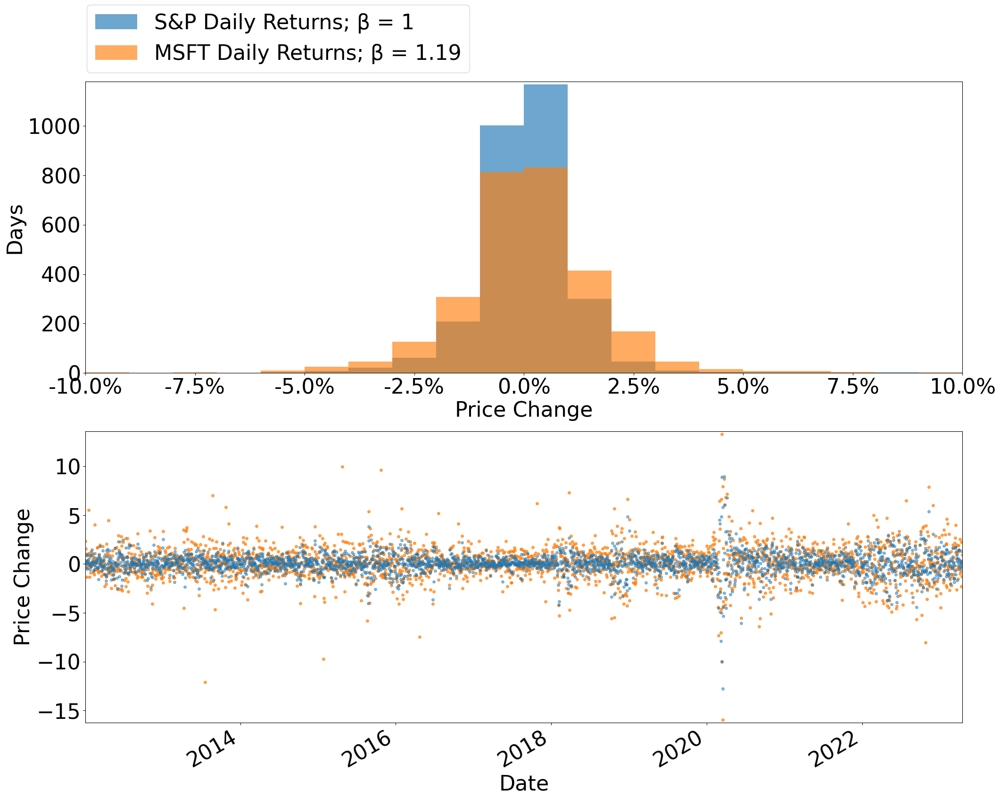

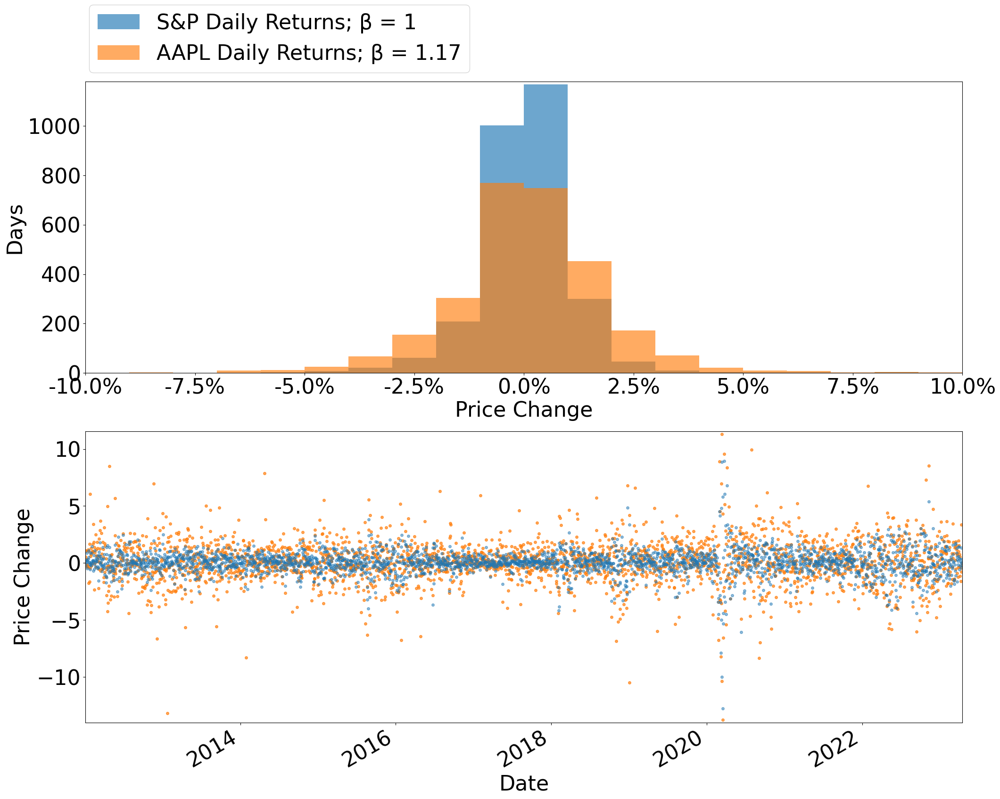

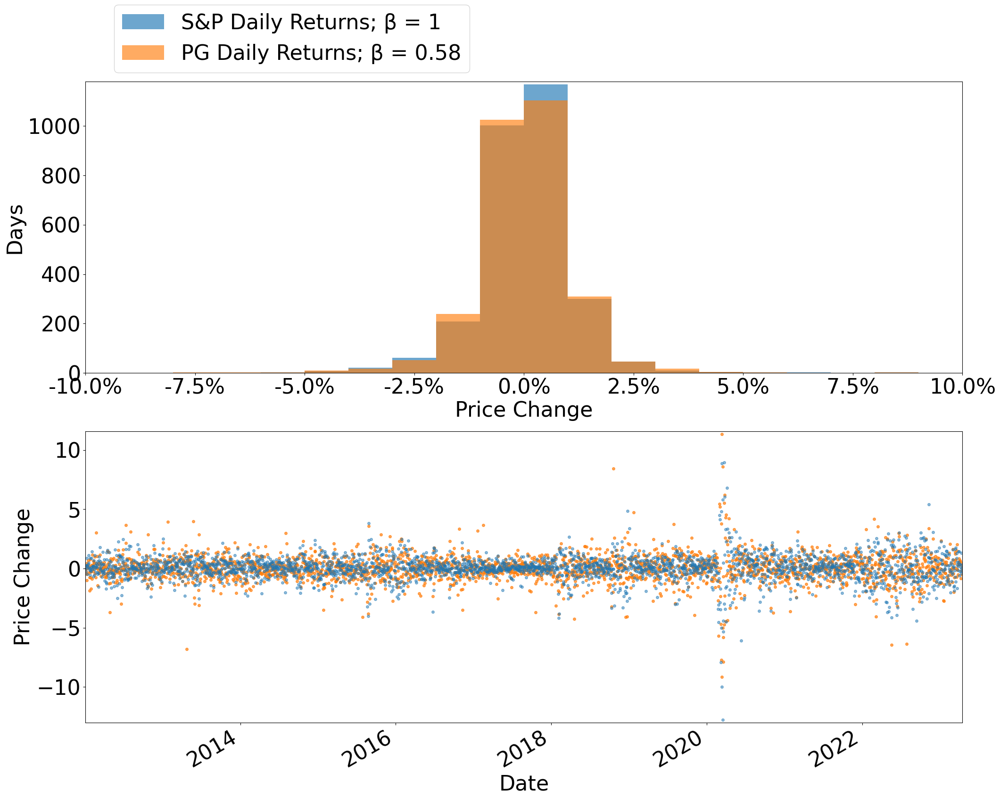

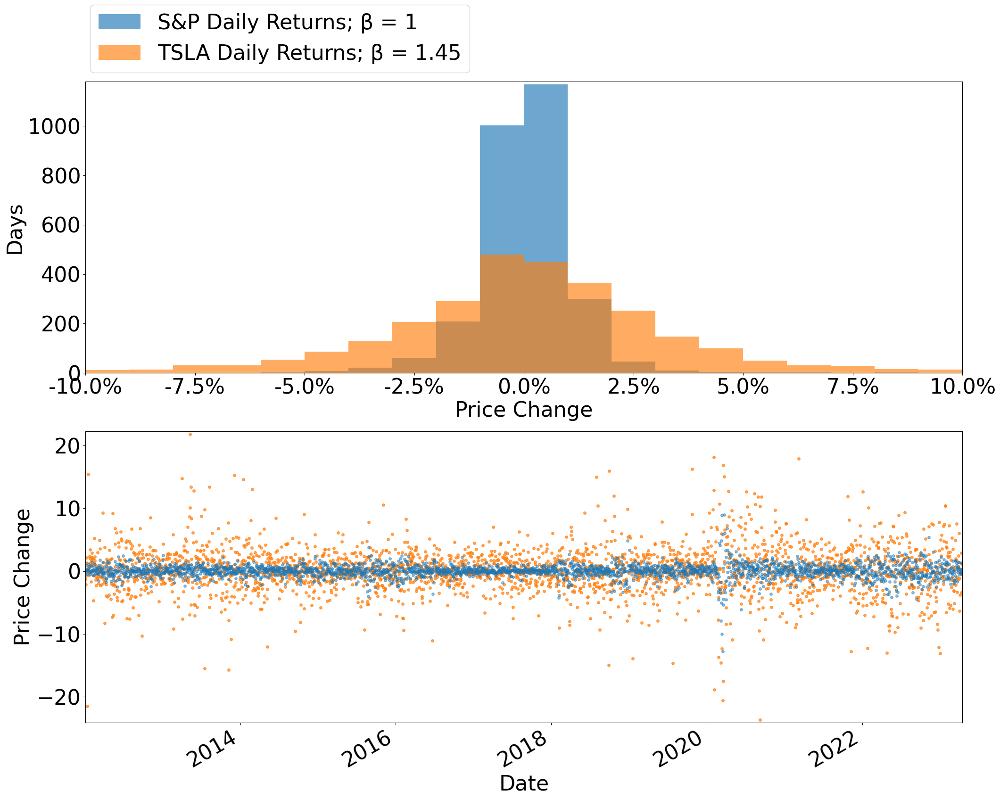

In [34]:
plot_data=price_change_data.mul(100)
for stock in stocks:
    fig, ax = plt.subplots(2,1, figsize=(24,20))

    plot_data["S&P500"].hist(bins=[x for x in range(-10, 11,1)],
                      label= "S&P Daily Returns; β = "+str(1),
                      ax=ax[0],
                      density=False,
                      grid=False,
                      alpha=.65)
    
    plot_data[stock].hist(bins=[x for x in range(-10, 11,1)],
                   label= stock + " Daily Returns; β = "+str(betas[stock].round(2)),
                   ax=ax[0],
                   density=False,
                   grid=False,
                   alpha=.65)
    ax[0].legend(bbox_to_anchor = (.45,1.3))
    ax[0].set_ylabel("Days")
    ax[0].set_xlabel("Price Change")
    ax[0].set_xticklabels([str(x) + "%" for x in ax[0].get_xticks()])
    ax[0].grid(False)
    plot_data[stock].plot(linestyle='',
                  marker='o',
                  alpha=.7,
                  markersize=4,
                  label= stock + " Weekly Returns",
                  c="C1",
                ax = ax[1])
        
    plot_data["S&P500"].plot(linestyle='',
                  marker='o',
                  alpha=.5,
                  markersize=4,
                  label= "S&P500 Weekly Returns",
                  c="C0",
                ax = ax[1])
    ax[1].set_ylabel("Price Change")

### Central Limit Theorem:

If $\bar{X}$ is the mean of a random sample of size $n$ taken
from a population with mean $\mu$ and finite variance $\sigma^2$, then the limiting form of
the distribution of
<h3 align="center">
    <font size="5">
        $ z = \frac{\bar{X} - \mu}{\frac{\sigma}{\sqrt{n}}}$
    </font>
</h3>

 as $\lim_{n \to \infty}$, is the *standard normal distribution* 
 
 The power of the CLT is that this holds no matter the type of distribution we are sampling from. So, for instance, if we took $30$ random samples from a lognormal distribution, the means of the samples would be normally distributed. 
 
 The Z-value tells us: what is the probability that a given sample mean would occur given the sample size and population mean? As n gets larger, the mean is expected to get more accurate if it does follow the population mean $\mu$
 
The gotten _z-score_ tells us how many standard deviations our sample mean $\bar{X}$ is from our population mean $\mu$.
 
 The normal approximation for $\bar{X}$ will generally be good if $n ≥ 30$, provided the population distribution is not terribly skewed. If $n < 30$, the approximation is good only if the population is not too different from a normal distribution and, as stated above, if the population is known to be normal, the sampling distribution of $\bar{X}$ will follow a normal distribution exactly, no matter how small the size of the samples.
 
We also choose the size of the sample, $n$, we want to take from the distributions. $30$ would be sufficient but we will use distributions with $100$ observations. We will draw $1000$ means to observe the mean value theorem visually. 

In [35]:
n =100
m=1000

dist_avgs = {"Die Rolls":[],
            "Poisson":[], 
            "Lognormal":[]}

for i in range(m):
    dist_avgs["Die Rolls"].append(np.average(np.random.randint(1,7,n))) 
    dist_avgs["Poisson"].append(np.average(np.random.poisson(1, n)))
    dist_avgs["Lognormal"].append(np.average(np.random.lognormal(0, 1, n)))
dist_avgs = pd.DataFrame(dist_avgs)
dist_avgs

,Die Rolls,Poisson,Lognormal
0,3.68,0.97,2.049957
1,3.44,0.98,1.589842
2,3.34,1.03,1.737688
3,3.53,1.01,1.685024
4,3.66,1.07,1.713445
...,...,...,...
995,3.55,0.89,1.337045
996,3.74,1.02,1.810023
997,3.26,1.06,1.842025
998,3.47,0.88,1.682256


Text(0.5, 1.0, 'Non-Centered Distributions')

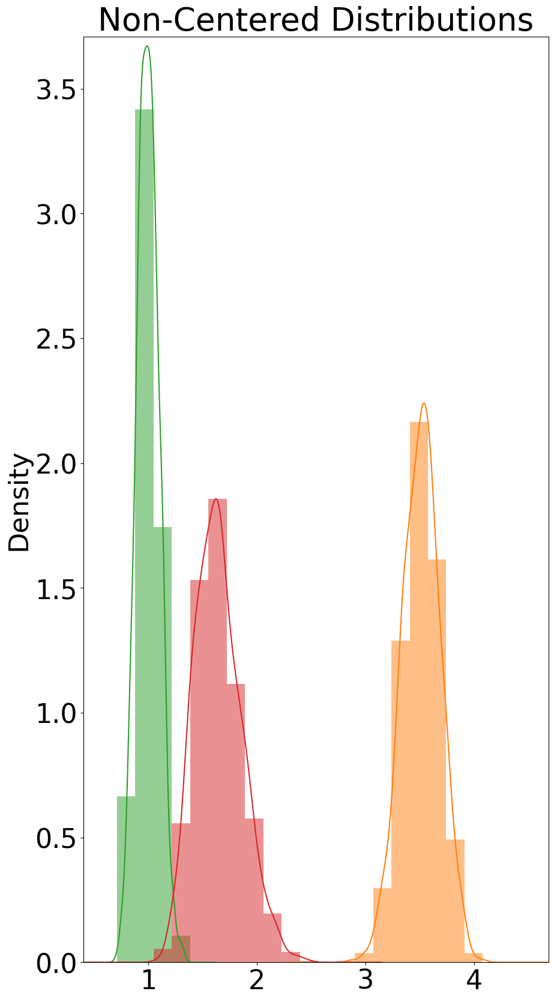

In [36]:
fig, axs = plt.subplots(1, figsize=(10, 20))
dist_avgs.plot.hist(density=True,
                    ax=axs,
                    bins=20,
                    color=["C1", "C2", "C3"],
                    alpha=.5,
                   legend = False)
dist_avgs.plot.kde(ax=axs, color=["C1", "C2", "C3"], legend=False)
axs.set_title("Non-Centered Distributions")

In [37]:
means_df = pd.DataFrame()
sd_df = pd.DataFrame()
# center distributions
 #df that centers the distributions at zero by substractiong the mean value frome each sample mean
for key in dist_avgs:
    means_df[key] = dist_avgs[key].sub(dist_avgs.mean()[key])
    #normalize distributions
    #divide each observation by the distributions standard devations
    sd_df[key] = means_df[key] / means_df.std()[key] 
sd_df[key]

0      1.879931
1     -0.245840
2      0.437220
3      0.193908
4      0.325215
         ...   
995   -1.413785
996    0.771415
997    0.919268
998    0.181118
999   -1.364692
Name: Lognormal, Length: 1000, dtype: float64

KeyError: 'Lognormal'

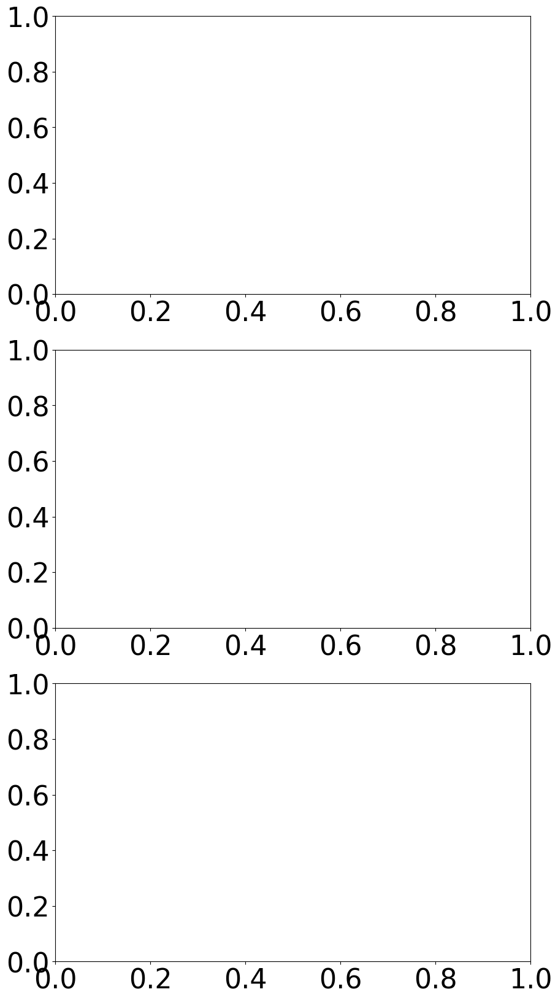

In [38]:
# save dfs in a single dictionary
df_dct={"Non-centered Distributions":dist_avgs,
    "Centered Distributions":means_df,
    "Centered Distributions Normalized by SD":sd_df}

keys = list (df_dct.keys())
num_figs=len(keys)
fig, axs = plt.subplots(3, figsize=(10, 20))
for i in range(num_figs):
    
    keys = keys[i]
    ax = axs[i]
    plot_df = df_dct[key]

    num_samples=len(plot_df.keys())
    colors=["C"+ str(c+1) for c in range(num_samples)]
# first, plot the dataframe containing the distributions of the random sample means 
    plot_df.plot.hist(density=True,
                    ax=ax,
                    bins=20,
                    color=["C1", "C2", "C3"],
                    alpha=.5,
                   legend = False)
    plot_df.plot.kde(ax=ax, color=["C1", "C2", "C3"], legend=False)
    ax.set_title(key)


## Simulation

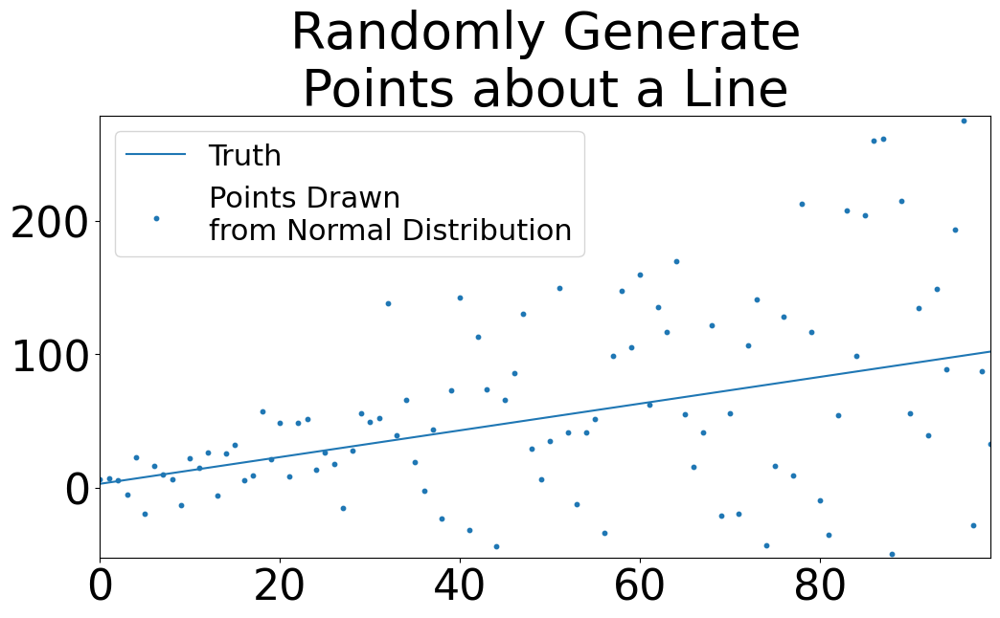

In [40]:
import random 
points=[]
line = np.array([i+3 for i in range(100)])
for point in line:
    points.append(random.normalvariate(mu=point,sigma=point))
figure=plt.figure(figsize=(12,6))
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)),
            points,
            label= "Points Drawn\nfrom Normal Distribution",
            s=10)
plt.title("Randomly Generate\nPoints about a Line")
plt.legend(loc= "best", fontsize=22)
plt.show()

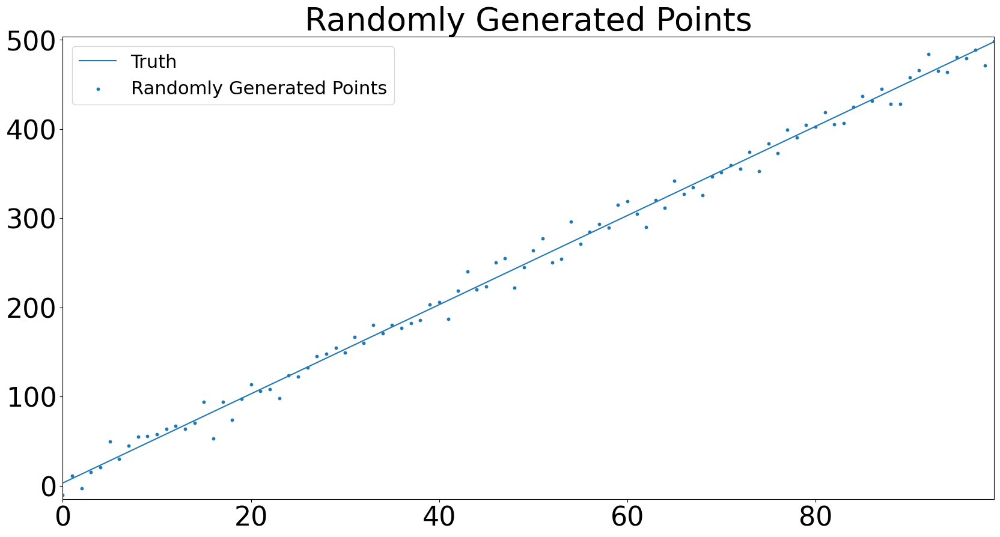

In [41]:
def build_random_data_with_line(y_int,slope,SD=1):
    line=np.array([slope * (i) + y_int for i in range(100)])
    points=[]
    for point in line:
        points.append(random.normalvariate(point, SD))
    return line,points
def plot_line(line, points, line_name = "Truth",   
              title = "Randomly Generated Points"):  
      
    figure = plt.figure(figsize = (20,10))
    plt.plot(line, label = line_name)  
    plt.scatter(np.arange(len(points)),points, s = 10,   
                label = title)
    plt.title(title)
    plt.legend(loc="best", fontsize = 22)
line,points= build_random_data_with_line(y_int=3,slope=5,SD=10)
plot_line(line,points)

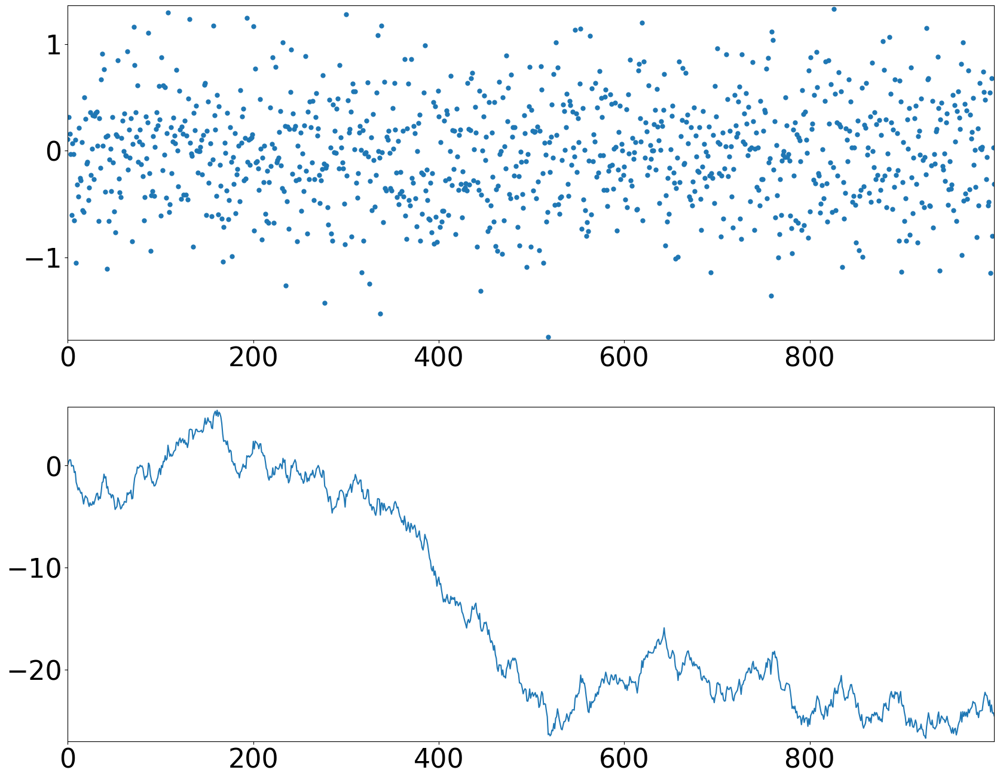

In [42]:
# single simulation

random_list = [random.normalvariate(0,.5) for i in range (1000)]
fig, ax =plt.subplots(2, figsize = (20,16))
ax[0].plot(random_list, ls = "", marker = ".", markersize = 10)

simulation = []

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i - 1] + val)
    
ax[1].plot(simulation)
plt.show()
plt.close()

In [44]:
pd.DataFrame(simulation[:10]).diff(),random_list

(          0
 0       NaN
 1  0.312165
 2  0.158096
 3 -0.034974
 4 -0.603492
 5  0.066296
 6 -0.035113
 7 -0.656439
 8  0.099514
 9 -1.054724,
 [0.10685593519939789,
  0.3121645082367107,
  0.15809608385212645,
  -0.03497398355593879,
  -0.603492326475404,
  0.06629559547291308,
  -0.035113492286731295,
  -0.6564393631069689,
  0.0995137539443172,
  -1.0547244587472138,
  -0.32040414793065763,
  -0.4312146141312587,
  0.2149760652288504,
  -0.25984502398028964,
  -0.2795912971860455,
  0.08143222411697831,
  -0.5586871667839942,
  -0.5742199574441457,
  0.4974160373238362,
  0.2975037728231452,
  -0.12149291657394161,
  -0.10678378680472173,
  -0.4631162913824894,
  -0.3445123644981697,
  0.3593179973785843,
  -0.23070807558926384,
  0.016229142567130938,
  0.3308790607264912,
  -0.26795302906356533,
  0.3239547174712829,
  0.3522964921661391,
  0.3676587847155292,
  0.04737791943056459,
  -0.6591686354307442,
  0.301547757838046,
  -0.162493257540269,
  0.6702816911744981,
  0.908599

In [47]:
mean = 0
sigma=1
mote_carlo_sim_dict={}
num_sims =2000
periods=1000
for i in range(num_sims):
    mote_carlo_sim_dict[i]={}
    for period in range(periods):
        curr_sim = mote_carlo_sim_dict[i]
        if period == 0:
            curr_sim[period]=random.normalvariate(mean,sigma)
        else:
            curr_sim[period]= curr_sim[period-1]+random.normalvariate(mean, sigma)

In [50]:
sim_df=pd.DataFrame(mote_carlo_sim_dict)
sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,4.031992,-0.081656,-1.878704,0.033028,0.180337,-1.712577,-0.509943,0.212569,0.336949,0.058398,...,-1.566485,-2.334484,0.617037,-0.214974,1.966877,0.538466,-0.720266,0.438898,-0.695063,0.826503
1,3.290150,0.837777,-1.041691,-0.797587,0.670366,-1.774212,0.024508,1.050019,-0.662934,0.230844,...,-3.531727,-4.071245,1.888432,0.354470,2.394891,1.249688,-2.740761,-0.357915,-0.383038,-0.623038
2,1.172710,1.066441,-0.380865,-0.445215,1.167902,-1.762615,1.037019,0.454788,-0.310530,-1.161862,...,-4.625681,-4.450948,0.832429,-0.031017,3.048518,1.532321,-2.551523,-1.057965,-0.166216,0.449069
3,1.227362,1.263616,-0.316042,1.056789,0.652033,-0.891565,1.227747,1.371411,2.041483,-2.951243,...,-3.620250,-5.534525,-0.261499,1.270266,3.664997,1.225355,-3.641044,-3.256422,-1.429721,-0.304194
4,0.948583,1.827487,-1.823450,2.151025,2.562225,-0.185651,-1.011602,0.321001,2.289823,-2.129948,...,-3.460127,-6.464655,-0.998742,0.786861,2.387490,1.802953,-5.507016,-5.124482,-2.047438,-0.047998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,39.898537,-33.362144,-60.234914,-12.799964,29.988312,22.574806,47.023896,21.038835,-20.726571,19.781694,...,5.719484,25.925117,7.379046,-12.642940,-26.757338,-61.057756,16.987788,-44.034228,-20.405598,19.828219
996,40.329160,-32.072640,-59.510196,-10.538115,29.917979,19.798754,47.158453,21.509927,-20.363986,19.656880,...,5.224488,25.277550,9.160876,-12.851615,-26.655831,-60.632557,15.105793,-43.597973,-17.922528,18.871811
997,40.562834,-30.053990,-59.188668,-11.296219,29.179750,20.041435,47.111370,20.192316,-19.383290,19.931347,...,4.588517,24.203659,7.998325,-13.587209,-27.486691,-61.644556,15.895171,-41.696769,-15.627241,19.184505
998,39.771852,-30.342689,-59.762544,-11.179338,29.627343,20.741482,46.854348,19.458913,-18.039361,19.619240,...,5.713765,23.476317,7.499700,-14.038859,-27.207154,-61.307822,14.848326,-40.578425,-15.372260,19.947274


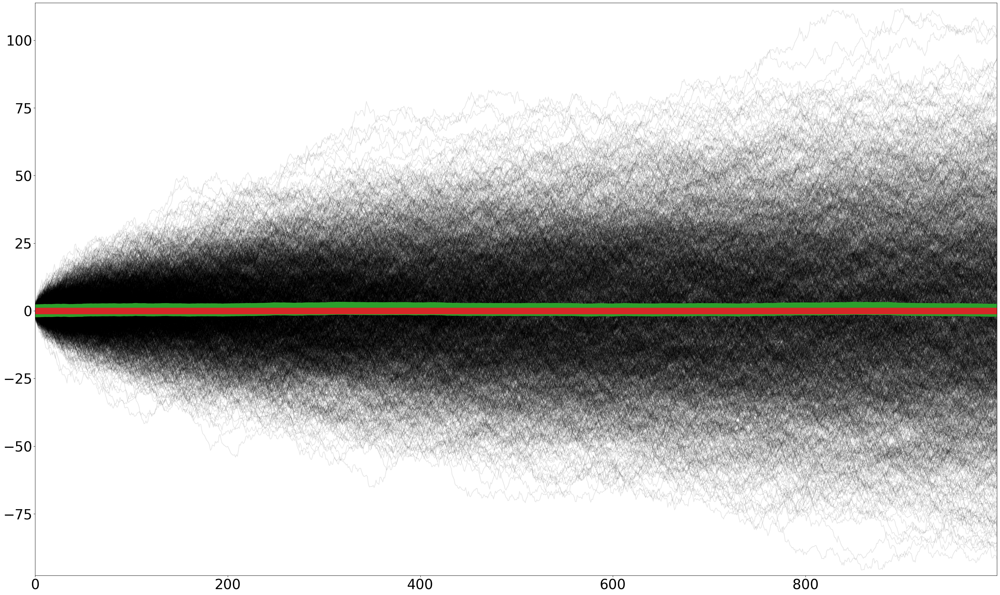

In [53]:
fig, ax=plt.subplots(figsize=(40,24))
pd.DataFrame(sim_df).plot.line(marker=".",markersize=.1,color="k",alpha=.1,ax=ax,legend=False)
sim_df.mean(axis=1).plot.line(color="C2",ax=ax,linewidth=30)
ax.axhline(0,linewidth=15, color="C3")

[Text(0, 0.0, '0%'),
 Text(0, 0.002, '0%'),
 Text(0, 0.004, '0%'),
 Text(0, 0.006, '0%'),
 Text(0, 0.008, '0%'),
 Text(0, 0.01, '1%'),
 Text(0, 0.012, '1%'),
 Text(0, 0.014, '1%'),
 Text(0, 0.016, '1%')]

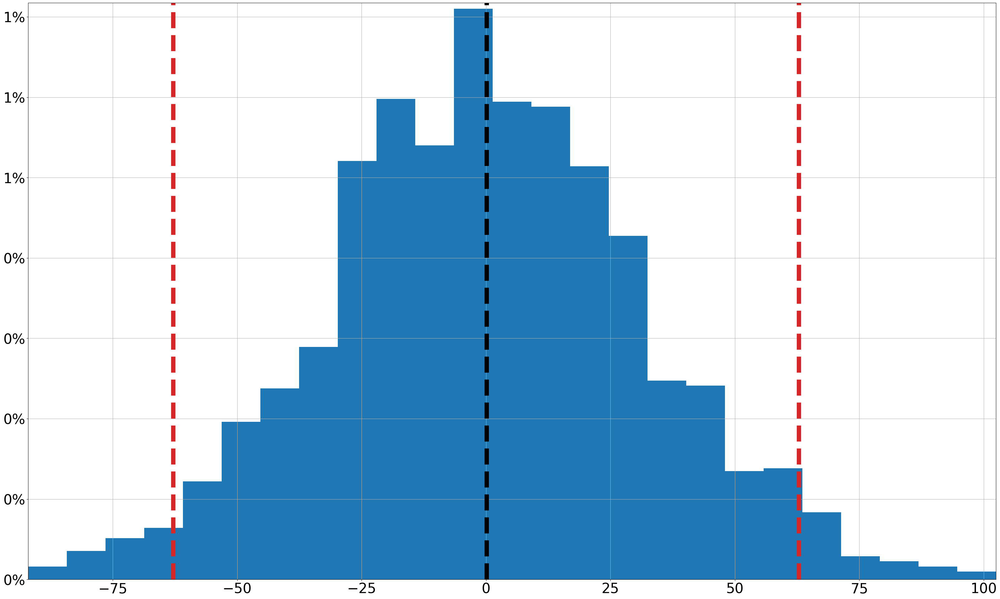

In [65]:
fig, ax = plt.subplots(figsize = (40, 24))
plot_df=sim_df.iloc[-1]
plot_df.hist(bins = 25, density = True,
                               ax = ax)
ax.axvline(plot_df.mean(), ls = "--",linewidth=10, color="k")
ax.axvline(plot_df.std()*2, ls = "--",linewidth=10, color="C3")
ax.axvline(plot_df.std()*-2, ls = "--",linewidth=10, color="C3")

y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100))+ "%" for y in y_vals]) 
